<a href="https://colab.research.google.com/github/ramayer/google-colab-examples/blob/main/Comparing_LAION_OpenCLIP_vs_OpenAI_CLIP_with_T_SNE_and_UMAP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Comparing LAION OpenCLIP vs OpenAI CLIP with T-SNE & UMAP

* Based on a Roboflow Notebook from https://colab.research.google.com/github/roboflow-ai/notebooks/blob/main/notebooks/image_embeddings_analysis_part_1.ipynb



---


In [ ]:
# LAION OpenCLIP
!pip install open_clip_torch >& /tmp/pip1.out
# OpenAI CLIP
!pip install git+https://github.com/openai/CLIP.git >& /tmp/pip2.out
# a great dataset tool
!pip install clip-retrieval >& /tmp/pip3.out
# the original includes
!pip install -qqq roboflow supervision umap-learn > /tmp/pip3.out

In [ ]:
import clip
print(f"CLIP models from OpenAI: {', '.join(clip.available_models())}")
import open_clip
print(f"CLIP models from LAION: {', '.join([str(m) for m in open_clip.list_pretrained()])}")

CLIP models from OpenAI: RN50, RN101, RN50x4, RN50x16, RN50x64, ViT-B/32, ViT-B/16, ViT-L/14, ViT-L/14@336px
CLIP models from LAION: ('RN50', 'openai'), ('RN50', 'yfcc15m'), ('RN50', 'cc12m'), ('RN50-quickgelu', 'openai'), ('RN50-quickgelu', 'yfcc15m'), ('RN50-quickgelu', 'cc12m'), ('RN101', 'openai'), ('RN101', 'yfcc15m'), ('RN101-quickgelu', 'openai'), ('RN101-quickgelu', 'yfcc15m'), ('RN50x4', 'openai'), ('RN50x16', 'openai'), ('RN50x64', 'openai'), ('ViT-B-32', 'openai'), ('ViT-B-32', 'laion400m_e31'), ('ViT-B-32', 'laion400m_e32'), ('ViT-B-32', 'laion2b_e16'), ('ViT-B-32', 'laion2b_s34b_b79k'), ('ViT-B-32-quickgelu', 'openai'), ('ViT-B-32-quickgelu', 'laion400m_e31'), ('ViT-B-32-quickgelu', 'laion400m_e32'), ('ViT-B-16', 'openai'), ('ViT-B-16', 'laion400m_e31'), ('ViT-B-16', 'laion400m_e32'), ('ViT-B-16', 'laion2b_s34b_b88k'), ('ViT-B-16-plus-240', 'laion400m_e31'), ('ViT-B-16-plus-240', 'laion400m_e32'), ('ViT-L-14', 'openai'), ('ViT-L-14', 'laion400m_e31'), ('ViT-L-14', 'laion40

**NOTE:** To make it easier for us to manage datasets, images and models we create a `HOME` constant. 

In [ ]:
%cd {HOME}
import os
HOME = os.getcwd()

if have_roboflow := False:
  import roboflow
  from roboflow import Roboflow
  roboflow.login()
  rf = Roboflow()
  project = rf.workspace("roboflow-jvuqo").project("mnist-42000-images-u0qdg")
  dataset = project.version(1).download("folder")


[Errno 2] No such file or directory: '{HOME}'
/content


In [ ]:
from clip_retrieval.clip_client import ClipClient, Modality
import os
import json
import requests
from PIL import Image
import torch
import os
import cv2
import supervision as sv
import numpy as np

def get_dataset(label,prefix='./data'):
  print(label,end=" ")
  os.makedirs(f'{prefix}/{label}',exist_ok=True)
  client = ClipClient(url="https://knn.laion.ai/knn-service", indice_name="laion5B-L-14")
  results = client.query(text=label)
  with open(f"{prefix}/{label}/search-results.json", "w") as f:
      json.dump(results, f)
  for idx,row in enumerate(results):
    try:
      print(idx,end='.', flush=True)
      img = requests.get(row['url'], timeout=3).content
      with open(f"{prefix}/{label}/{row['id']}.jpg","wb") as f:
        f.write(img)
    except:
      pass
  print('')
get_dataset('photo of a cat')
get_dataset('photo of a dog')
get_dataset('drawing of a cat')
get_dataset('drawing of a dog')


photo of a cat 0.1.2.3.4.5.6.7.8.9.10.11.12.13.14.15.16.17.18.19.20.21.22.23.24.25.26.
photo of a dog 0.1.2.3.4.5.6.7.8.9.10.
drawing of a cat 0.1.2.3.4.5.6.7.8.9.10.11.12.13.14.15.16.17.18.19.20.21.22.
drawing of a dog 0.1.2.3.4.5.6.7.8.9.10.11.12.13.14.15.16.17.18.19.20.21.22.


**NOTE:** List of dataset classes

In [ ]:
!ls data

'drawing of a cat'  'drawing of a dog'	'photo of a cat'  'photo of a dog'


## LAION OpenClip embeddings.

In [ ]:
model='ViT-B-32-quickgelu'
pretrained='laion400m_e32'
device='cuda'
openclip_m,openclip_c,openclip_p = open_clip.create_model_and_transforms(model,pretrained=pretrained,device=device)

def get_openclip_embedding(imgs):
  with torch.no_grad():
    preprocessed = torch.stack([openclip_p(i) for i in imgs])
    features = openclip_m.encode_image(preprocessed)
    features /= features.norm(dim=-1, keepdim=True)
    return features[0]


In [ ]:
e = get_openclip_embedding([Image.open('./data/drawing of a cat/1081972341.jpg')])
e.numpy().shape

(512,)

## OpenAI CLIP

In [ ]:
import clip
clip.available_models()

['RN50',
 'RN101',
 'RN50x4',
 'RN50x16',
 'RN50x64',
 'ViT-B/32',
 'ViT-B/16',
 'ViT-L/14',
 'ViT-L/14@336px']

In [ ]:
model_name='ViT-B/32'
device='cuda'

openai_clip_model, openai__preprocess = clip.load(model_name,device)

def get_openai_clip_embedding(imgs):
  with torch.no_grad():
    preprocessed = torch.stack([openai__preprocess(i) for i in imgs])
    features = openai_clip_model.encode_image(preprocessed)
    features /= features.norm(dim=-1, keepdim=True)
    return features[0]


In [ ]:
e = get_openai_clip_embedding([Image.open('./data/drawing of a cat/1081972341.jpg')])
e.numpy().shape

(512,)

## Visualize the embedings

In [ ]:
import base64

def image_to_data_uri(image_path):
    with open(image_path, "rb") as image_file:
        encoded_image = base64.b64encode(image_file.read()).decode("utf-8")
    return "data:image/jpeg;base64," + encoded_image

SOURCE_DIR = './data'
import glob

labels = []
openclip_embeddings = []
openai_clip_embeddings = []
train = []
images = []
image_paths = []

class_ids = sorted(os.listdir(SOURCE_DIR))

for class_id in class_ids:
    source_subdir = os.path.join(SOURCE_DIR, class_id)
    for image_path in glob.glob(source_subdir+'/*.jpg'):
      try:
        image = cv2.imread(str(image_path), cv2.IMREAD_GRAYSCALE)
        img = Image.open(image_path)
        openclip_emb = get_openclip_embedding([img])
        openclip_embeddings.append(openclip_emb.numpy())
        openai_clip_emb = get_openai_clip_embedding([img])
        openai_clip_embeddings.append(openai_clip_emb.numpy())
        labels.append(class_id)
        images.append(image)
        image_paths.append(str(image_path))
      except:
        print(f"can't process {image_path}")
        # datasets can have some invalid images
        pass

#trainbak = train
# class associated with image
labels = np.array(labels)
# features extracted from image
openclip_embeddings = np.array(openclip_embeddings)
openai_clip_embeddings = np.array(openai_clip_embeddings)

# local image path
image_paths = np.array(image_paths)
# cached images
image_data_uris = {path: image_to_data_uri(path) for path in image_paths}

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:975: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


can't process ./data/drawing of a dog/908328561.jpg


In [ ]:
openai_clip_embeddings = np.array(openai_clip_embeddings)


### Visualization

In [ ]:
import plotly.graph_objects as go
import plotly.express as px
import numpy as np

from typing import Dict
from pathlib import Path
from IPython.core.display import display, HTML


def display_projections(
    labels: np.ndarray,
    projections: np.ndarray,
    image_paths: np.ndarray,
    image_data_uris: Dict[str, str],
    show_legend: bool = False,
    show_markers_with_text: bool = True
) -> None:
    # Create a separate trace for each unique label
    unique_labels = np.unique(labels)
    traces = []
    for unique_label in unique_labels:
        mask = labels == unique_label
        customdata_masked = image_paths[mask]
        trace = go.Scatter3d(
            x=projections[mask][:, 0],
            y=projections[mask][:, 1],
            z=projections[mask][:, 2],
            mode='markers+text' if show_markers_with_text else 'markers',
            text=labels[mask],
            customdata=customdata_masked,
            name=str(unique_label),
            marker=dict(size=8),
            hovertemplate="<b>class: %{text}</b><br>path: %{customdata}<extra></extra>"
        )
        traces.append(trace)

    # Create the 3D scatter plot
    fig = go.Figure(data=traces)
    fig.update_layout(
        scene=dict(xaxis_title='X', yaxis_title='Y', zaxis_title='Z'),
        width=1000,
        height=1000,
        showlegend=show_legend
    )

    # Convert the chart to an HTML div string and add an ID to the div
    plotly_div = fig.to_html(full_html=False, include_plotlyjs=False, div_id="scatter-plot-3d")

    # Define your JavaScript code for copying text on point click
    javascript_code = f"""
    <script>
        function displayImage(imagePath) {{
            var imageElement = document.getElementById('image-display');
            var placeholderText = document.getElementById('placeholder-text');
            var imageDataURIs = {image_data_uris};
            imageElement.src = imageDataURIs[imagePath];
            imageElement.style.display = 'block';
            placeholderText.style.display = 'none';
        }}

        // Get the Plotly chart element by its ID
        var chartElement = document.getElementById('scatter-plot-3d');

        // Add a click event listener to the chart element
        chartElement.on('plotly_click', function(data) {{
            var customdata = data.points[0].customdata;
            displayImage(customdata);
        }});
    </script>
    """

    # Create an HTML template including the chart div and JavaScript code
    html_template = f"""
    <!DOCTYPE html>
    <html>
        <head>
            <script src="https://cdn.plot.ly/plotly-latest.min.js"></script>
            <style>
                #image-container {{
                    position: fixed;
                    top: 0;
                    left: 0;
                    width: 200px;
                    height: 200px;
                    padding: 5px;
                    border: 1px solid #ccc;
                    background-color: white;
                    z-index: 1000;
                    box-sizing: border-box;
                    display: flex;
                    align-items: center;
                    justify-content: center;
                    text-align: center;
                }}
                #image-display {{
                    width: 100%;
                    height: 100%;
                    object-fit: contain;
                }}
            </style>
        </head>
        <body>
            {plotly_div}
            <div id="image-container">
                <img id="image-display" src="" alt="Selected image" style="display: none;" />
                <p id="placeholder-text">Click on a data entry to display an image</p>
            </div>
            {javascript_code}
        </body>
    </html>
    """

    # Display the HTML template in the Jupyter Notebook
    display(HTML(html_template))

## LAION OpenCLIP Embeddings visualized wit T-SNE

**NOTE:** 👆 click on data point (dot) to see associated image.

generating projections with T-SNE took: 0.74 sec



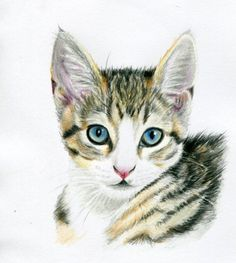
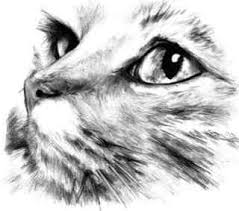
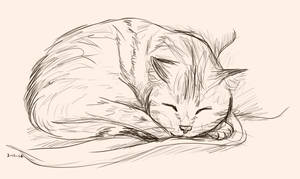
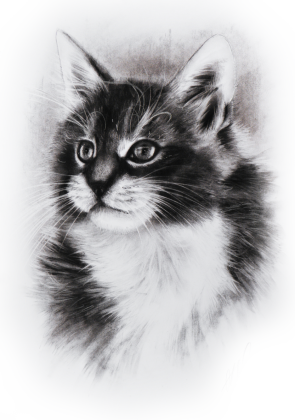
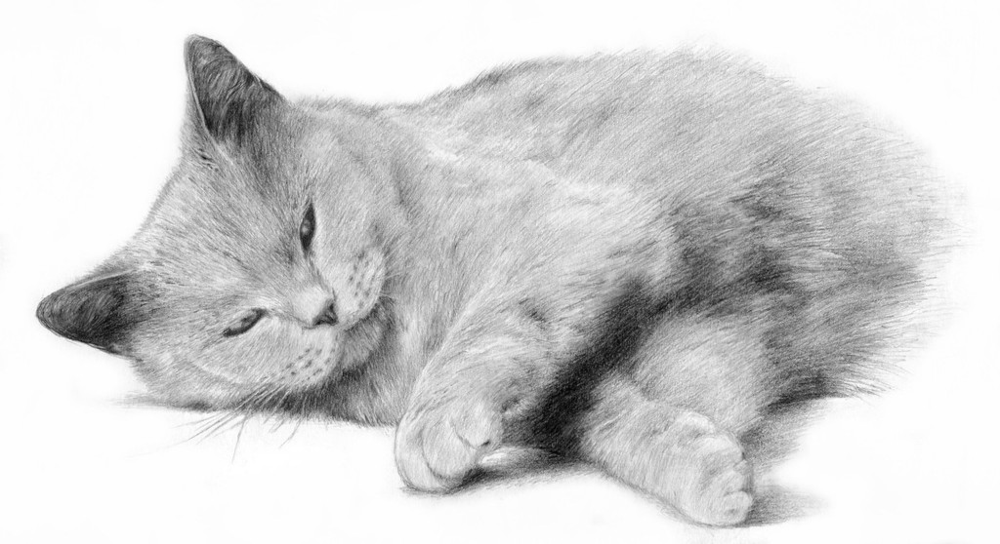
...
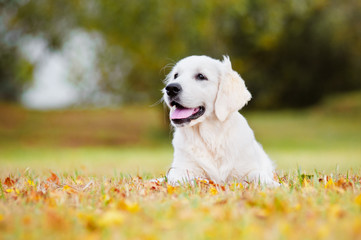
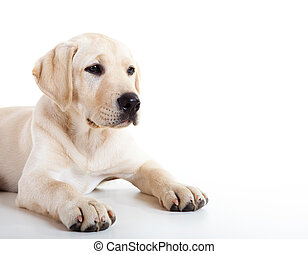
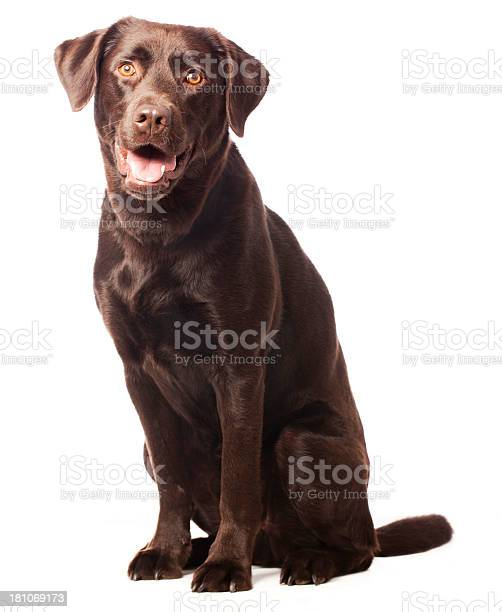
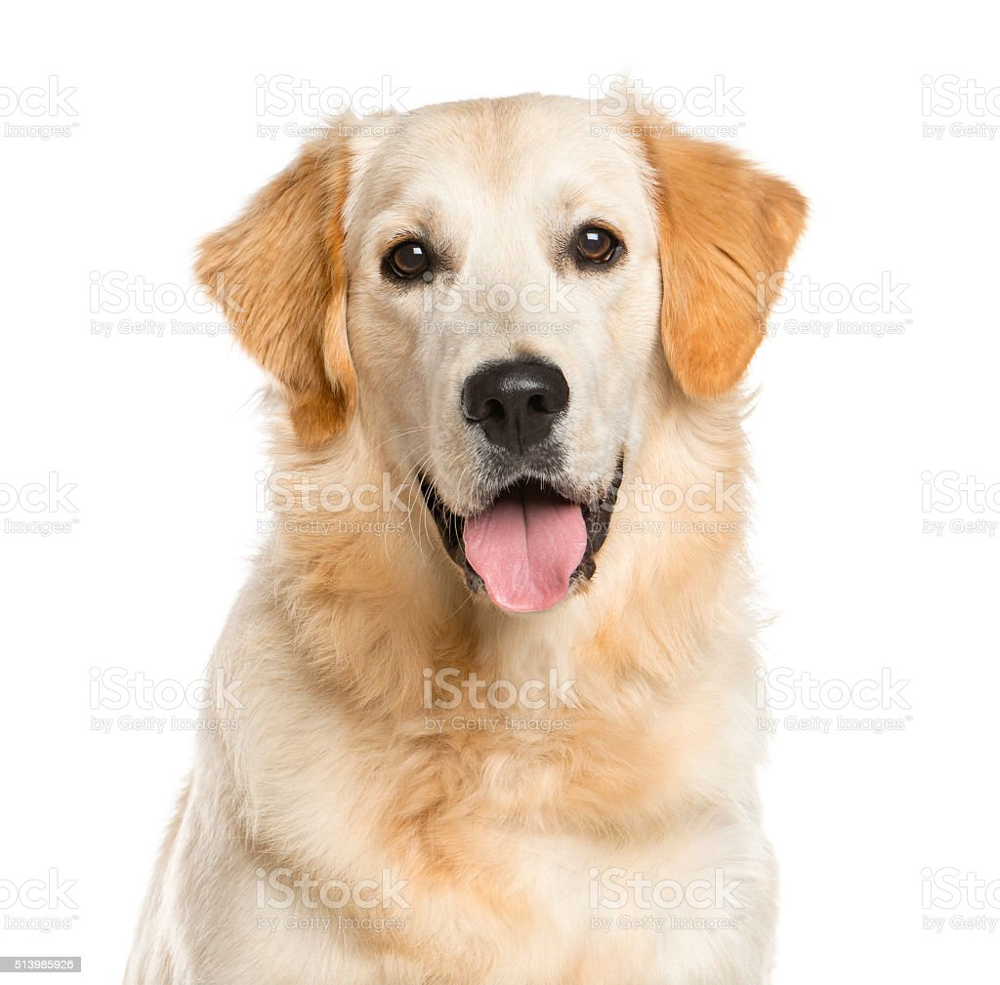
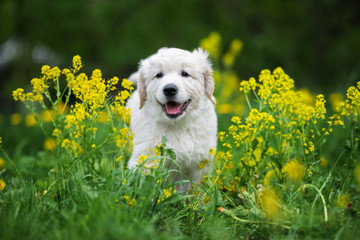

In [ ]:
from sklearn.manifold import TSNE
import time

start = time.time()
tsne = TSNE(n_components = 3, random_state=0 ,perplexity=5,n_iter=1000)
projections = tsne.fit_transform(openclip_embeddings)
end = time.time()
print(f"generating projections with T-SNE took: {(end-start):.2f} sec")
projections[0:10]


display_projections(
    labels=labels,
    projections=projections,
    image_paths=image_paths,
    image_data_uris=image_data_uris
)

## OpenCLIP Embeddings visualized with UMAP

In [ ]:
import umap
import time

start = time.time()
projections = umap.UMAP(n_components=3).fit_transform(openclip_embeddings)
end = time.time()
print(f"generating projections with UMAP took: {(end-start):.2f} sec")
display_projections(
    labels=labels,
    projections=projections,
    image_paths=image_paths,
    image_data_uris=image_data_uris
)

generating projections with UMAP took: 7.63 sec



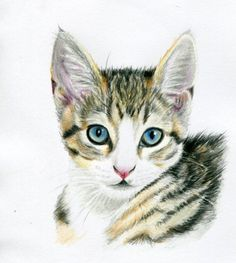
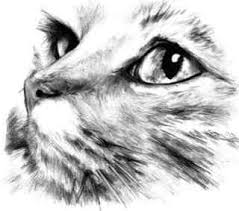
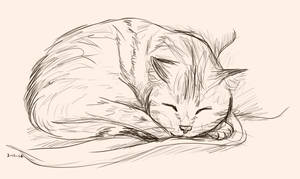
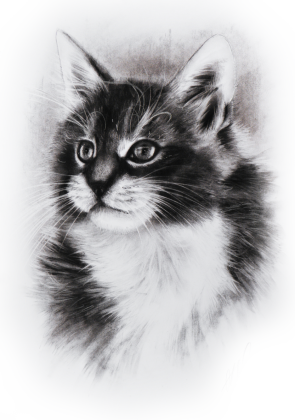
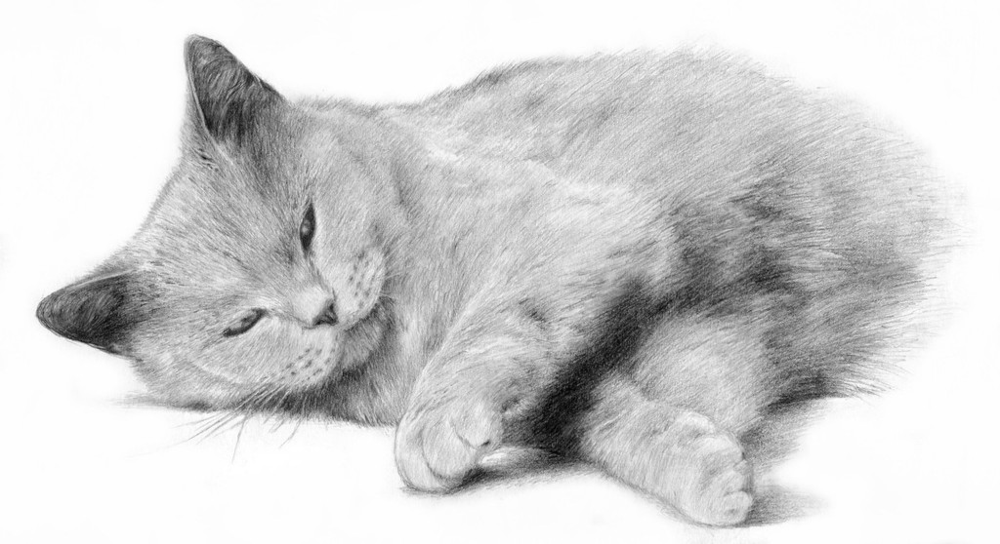
...
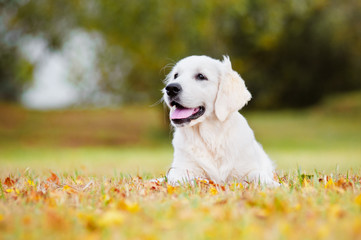
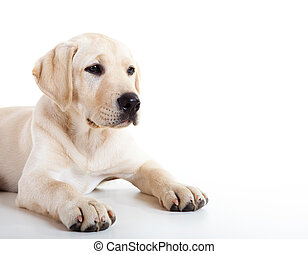
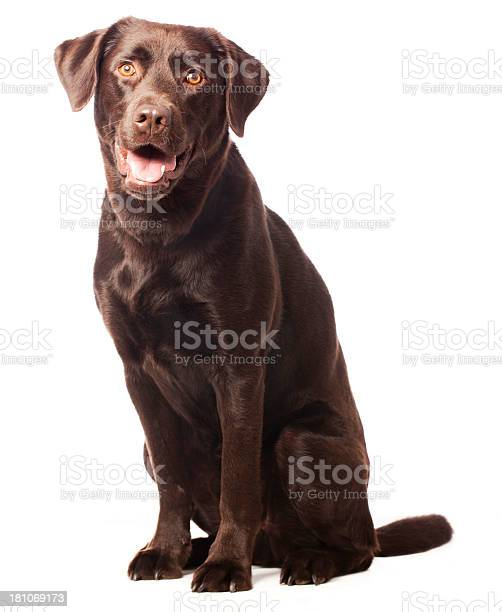
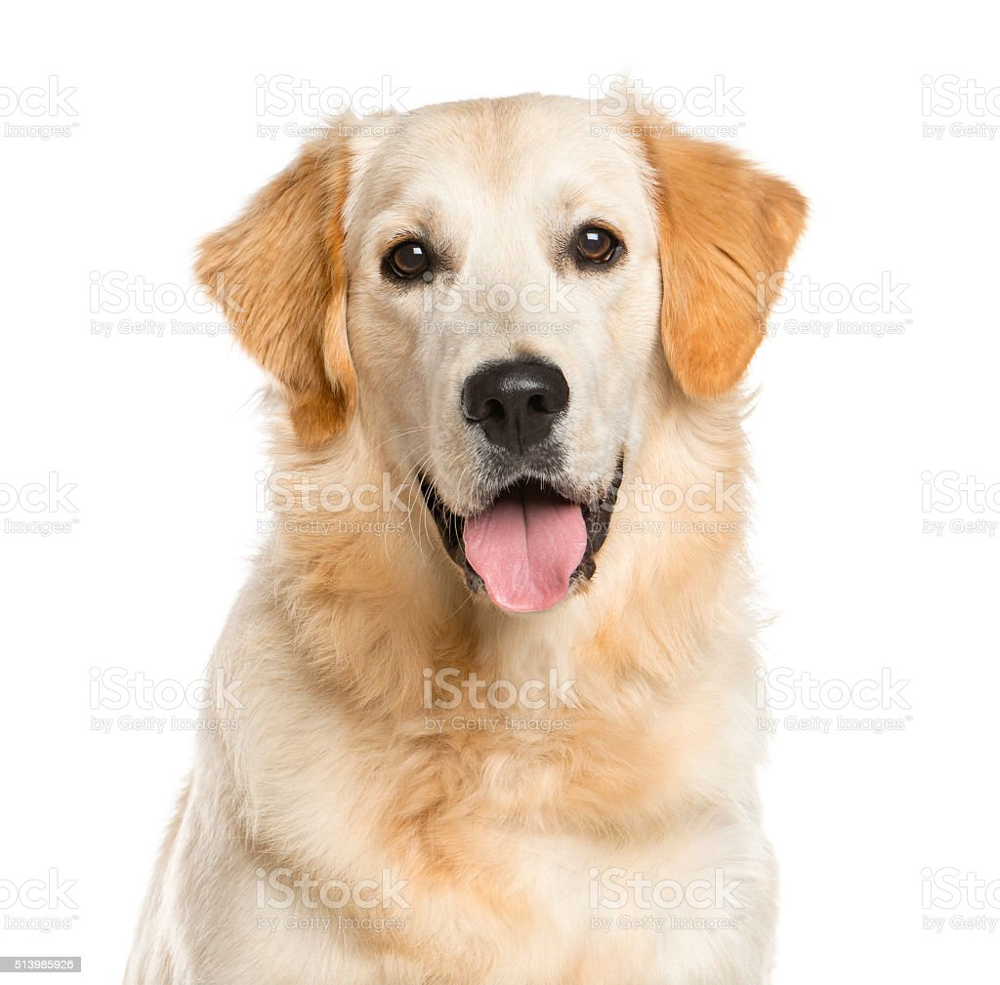
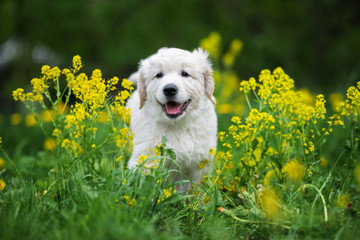

## OpenAI CLIP Embeddings visualized wit T-SNE

generating projections with T-SNE took: 2.81 sec



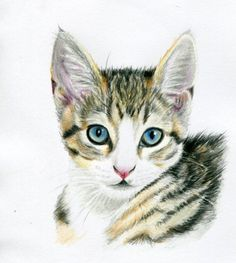
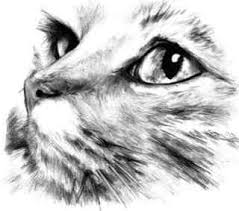
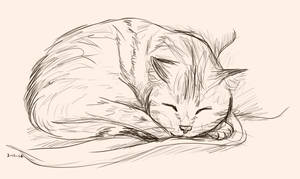
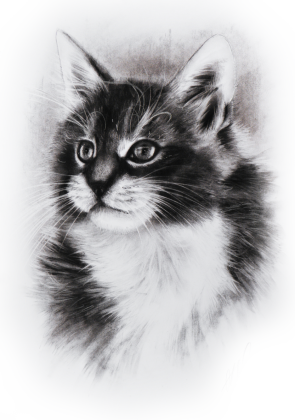
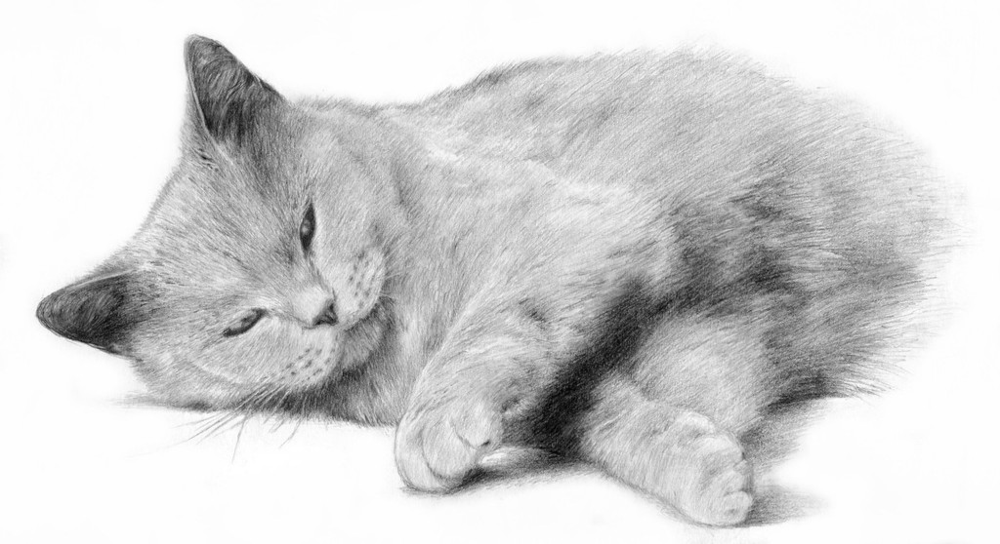
...
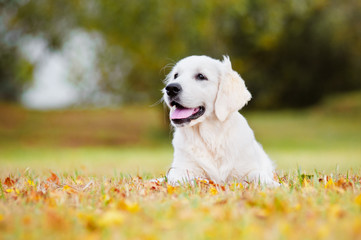
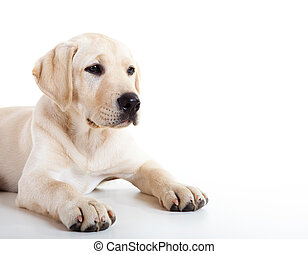
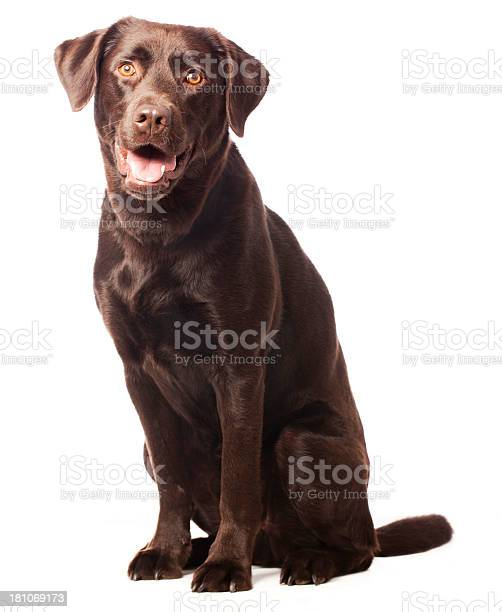
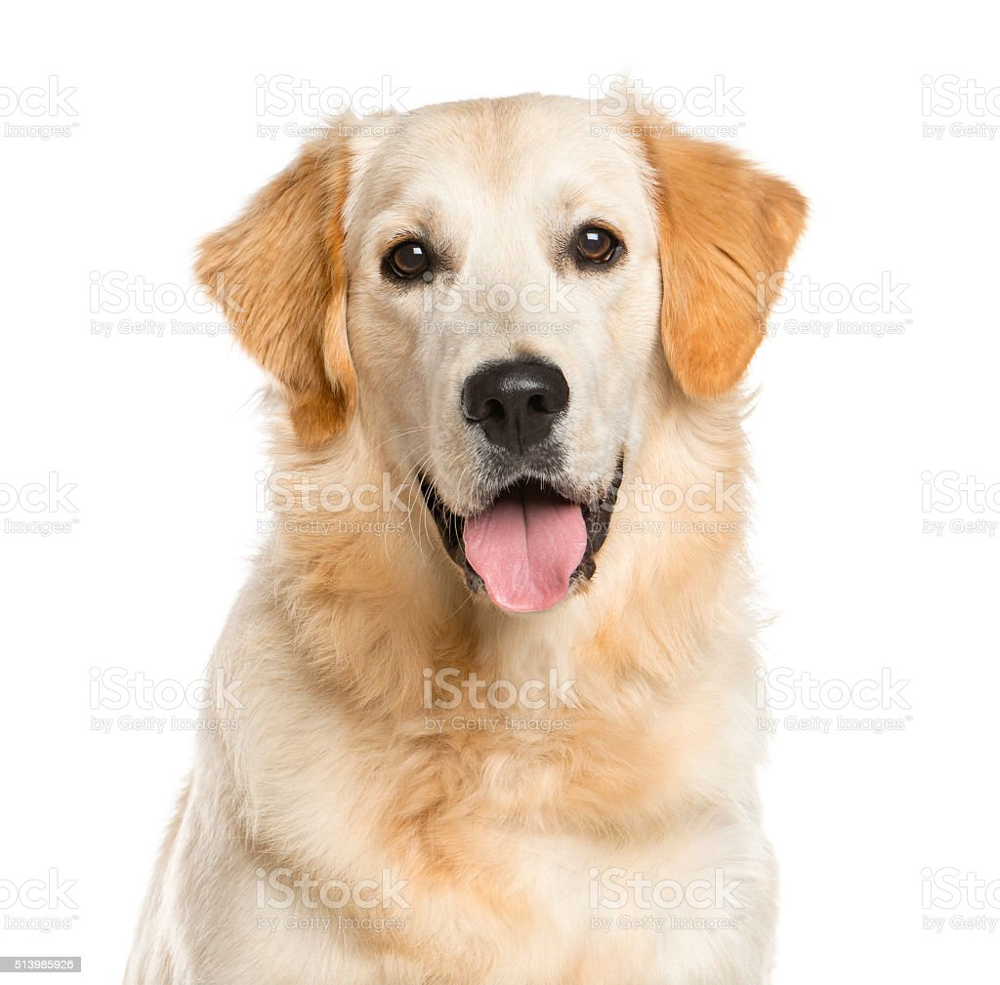
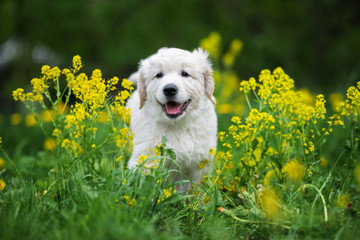

In [ ]:
from sklearn.manifold import TSNE
import time

start = time.time()
tsne = TSNE(n_components = 3, random_state=0 ,perplexity=5,n_iter=1000)
projections = tsne.fit_transform(openai_clip_embeddings)
end = time.time()
print(f"generating projections with T-SNE took: {(end-start):.2f} sec")
projections[0:10]


display_projections(
    labels=labels,
    projections=projections,
    image_paths=image_paths,
    image_data_uris=image_data_uris
)

generating projections with UMAP took: 5.76 sec



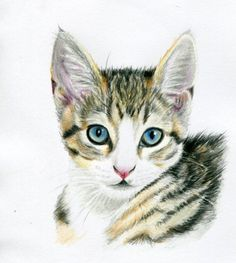
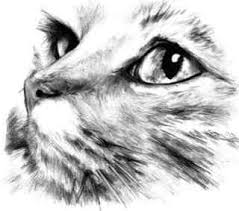
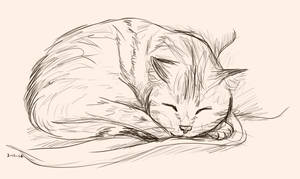
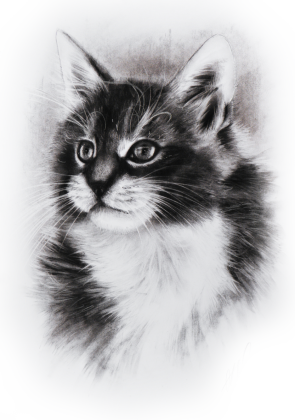
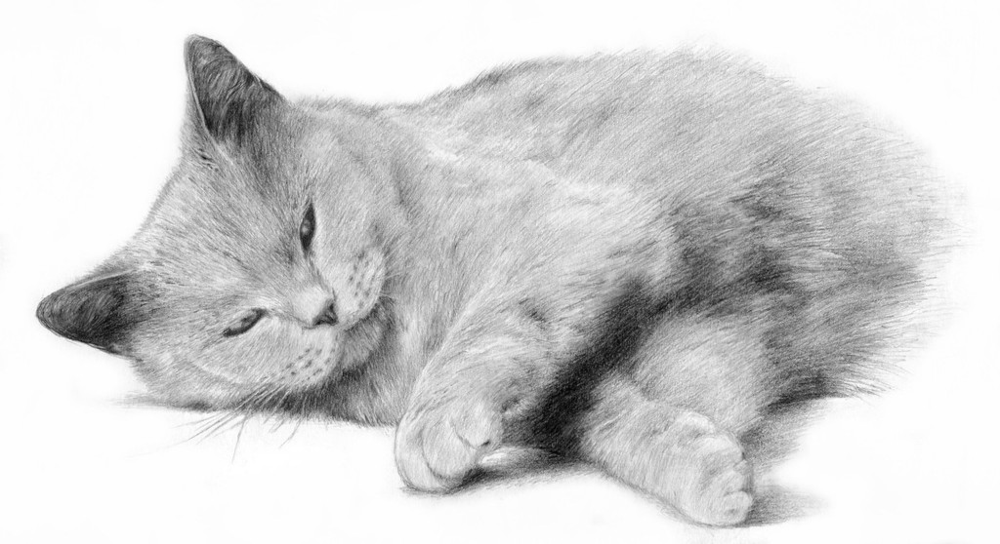
...
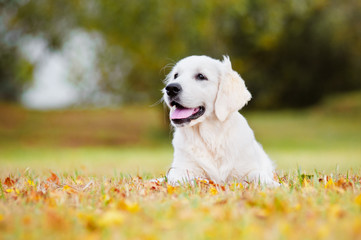
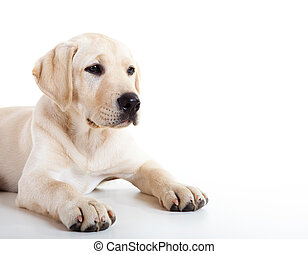
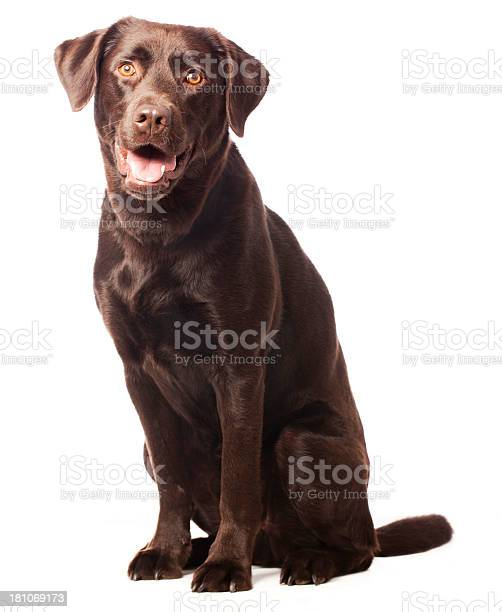
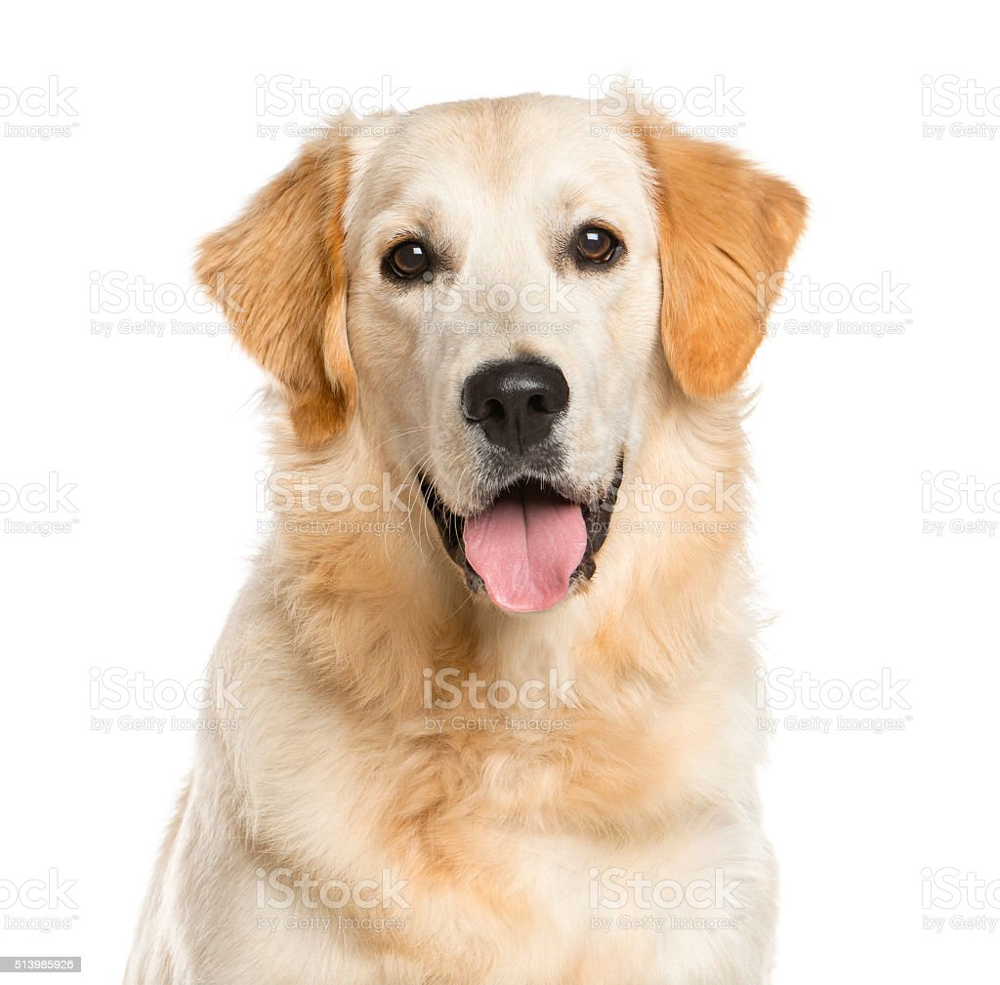
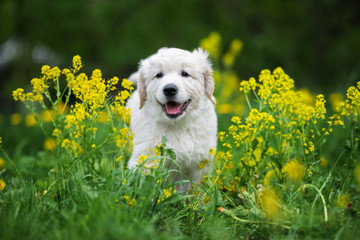

In [ ]:
import umap
import time

start = time.time()
projections = umap.UMAP(n_components=3).fit_transform(openai_clip_embeddings)
end = time.time()
print(f"generating projections with UMAP took: {(end-start):.2f} sec")
display_projections(
    labels=labels,
    projections=projections,
    image_paths=image_paths,
    image_data_uris=image_data_uris
)